# Clear all 

In [1]:
reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


# Importing Modules 

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

In [4]:
import pickle
import scipy.io as sio
from basicFunctions.filters import \
                        butter_bandpass_filter,butter_highpass_filter,butter_lowpass_filter
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages

In [5]:
%load_ext autoreload
%autoreload 2

In [834]:
from intanRead.IntanRaw_read_data import IntanRaw_read_data

from mainFunctions.loadDataFilePath import loadDataFilePath
from mainFunctions.readDigitalChannels import readDigitalChannels
from mainFunctions.readAnalogChannels import readAnalogChannels
from mainFunctions.stimOnsetExtraction import stimOnsetExtraction
from mainFunctions.loadSpikesFromPhy import loadSpikesFromPhy
from mainFunctions.neuronsInfoExtraction import neuronsInfoExtraction
from mainFunctions.pupilSizeReading import pupilSizeReading
from mainFunctions.spikeTriggeredAvgPupilSize import spikeTriggeredAvgPupilSize
from mainFunctions.neuronVisualResponse import neuronVisualResponse
from mainFunctions.tuningCurveAndOSI import tuningCurveAndOSI
from mainFunctions.extractLowAndHighArousalTrials import extractLowAndHighArousalTrials
from mainFunctions.allTrialsResponses import allTrialsResponses
from mainFunctions.responseChangeByAlertness import responseChangeByAlertness
from mainFunctions.bestOrienationResponseChangeByAlertness\
                    import bestOrienationResponseChangeByAlertness
from mainFunctions.noiseCorrBetweenAlertAndNonAlertTrials\
                    import noiseCorrBetweenAlertAndNonAlertTrials
from mainFunctions.powerSpectrumSingleChannel import powerSpectrumSingleChannel
from mainFunctions.estimatedL5chnnael import estimatedL5chnnael
from mainFunctions.exctractAlertAndNonAlertPeriods import exctractAlertAndNonAlertPeriods
from mainFunctions.spectrumCompareAlertNonAlert import spectrumCompareAlertNonAlert
from mainFunctions.normalizedBetween_0_and_1 import normalizedBetween_0_and_1
from mainFunctions.spontFR_CompareAlertAndNonAlert import spontFR_CompareAlertAndNonAlert
from basicFunctions.temporalPlot import temporalPlot
from basicFunctions.crossCorrelogram import crossCorrelogram
from mainFunctions.hilbertTransformedLFP_FrameRateAvg import hilbertTransformedLFP_FrameRateAvg
from mainFunctions.motionStillnessPowerCompare import motionStillnessPowerCompare
from mainFunctions.powerLFP_FrameAvg import powerLFP_FrameAvg
from mainFunctions.stimOffsetExtraction import stimOffsetExtraction
from mainFunctions.facemapDataReading import facemapDataReading
from mainFunctions.spikeTriggeredAvgFacialMovement import spikeTriggeredAvgFacialMovement
from basicFunctions.firingRate import firingRate



darkMode = True

if darkMode:
    plt.style.use('dark_background')

## Getting the data file

In [7]:
dataFileAdd, dataFileBaseFolder, infoFileAdd = loadDataFilePath\
                            ("X:\Ehsan-temp\Claire-Ehsan_Share")

## Reading the info file

In [8]:
infoResult = IntanRaw_read_data(infoFileAdd)
channelsNo = len(infoResult['amplifier_channels'])
ADC_channelsNo = len(infoResult['board_adc_channels'])
fs = int(infoResult['frequency_parameters']['board_dig_in_sample_rate'])


Reading Intan Technologies RHD2000 Data File, Version 1.5

Found 64 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 6 board ADC channels.
Found 16 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

Header file contains no data.  Amplifiers were sampled at 20.00 kS/s.
Done!  Elapsed time: 0.1 seconds


### Reading the digital data file

In [10]:
stimID, firstBeforeStimTagSampleNo , lastStimTagSampleNo, \
        stimOnset_DigitalTag_afterStimOnFlip = readDigitalChannels(dataFileBaseFolder)

### Reading the analog data file to extract raw photoDiodeSignal and raw camerastrob

In [11]:
photoDiodeSignal, cameraStrobe, wheelSensorSignal = readAnalogChannels(dataFileBaseFolder,ADC_channelsNo)

### extracting frame start samples and reading facemap data

154832 :Number of strobe signals
154832 :Number of saved frames
these two numbers should be the same


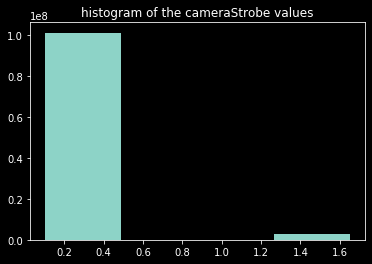

In [825]:
framesStartSample, pupilSmoothArea, motion = \
                                facemapDataReading(cameraStrobe,dataFileBaseFolder,darkMode = darkMode)

### stimOnset based on the photoDiode Signal

960 : detected stim onsets from the photodiode sensor


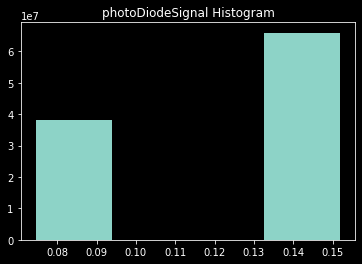

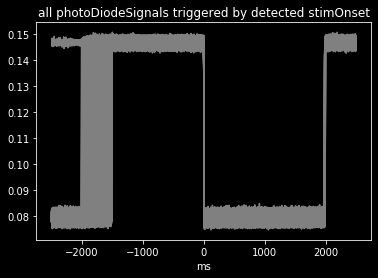

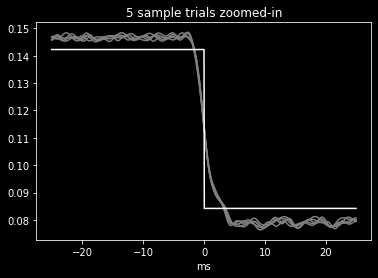

In [808]:
stimOnsetSample = stimOnsetExtraction(photoDiodeSignal,firstBeforeStimTagSampleNo, lastStimTagSampleNo,\
                            stimOnset_DigitalTag_afterStimOnFlip,\
                                      fs)

### extracting the stim offset samples

960 : detected stim offsets from the photodiode sensor


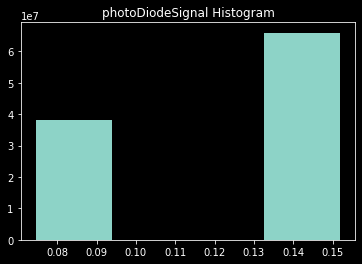

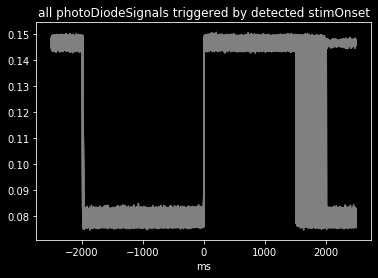

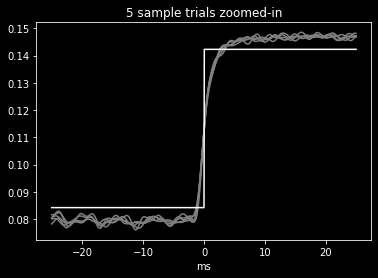

In [819]:
stimOffsetSample = stimOffsetExtraction(photoDiodeSignal,firstBeforeStimTagSampleNo, lastStimTagSampleNo,\
                            stimOnset_DigitalTag_afterStimOnFlip,\
                                      fs)

## loading the sorting results from KiloSort-Phy

#### Ctl+s in Phy first!

In [924]:
spikesSample, spikeClusters, SUA_clusters, MUA_clusters = loadSpikesFromPhy(dataFileBaseFolder)
spikeTime = spikesSample/fs

## Extracting the spike wave-shapes, spont FRs and the channels

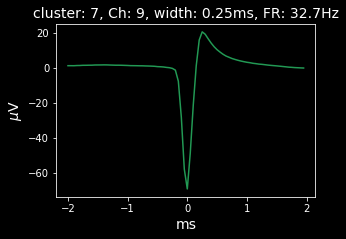

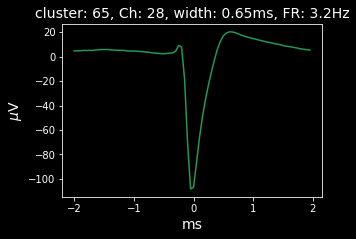

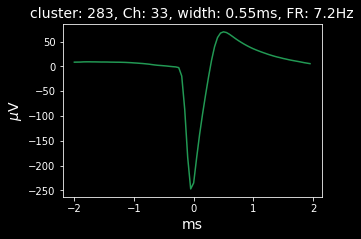

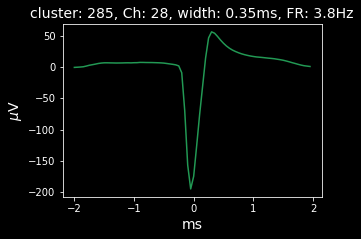

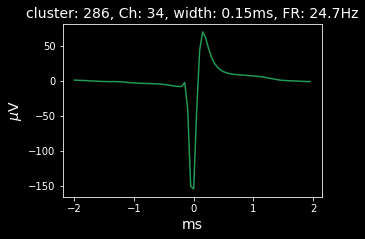

In [925]:
spontFRs, spikeWidthAll, clusterChannel, spikeShapesFiltered, spikeClustersToPlot, recordingDurInMS = \
    neuronsInfoExtraction(dataFileAdd, spikesSample, spikeClusters, SUA_clusters, MUA_clusters,\
                          firstBeforeStimTagSampleNo,\
                          fs, spikeTypes = 'SUA')

### spike-triggered Average of pupil size

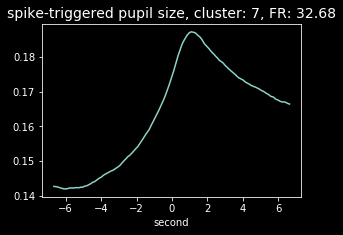

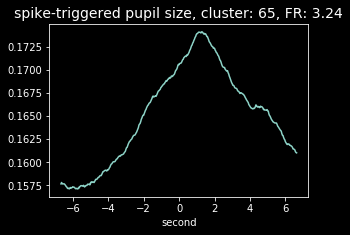

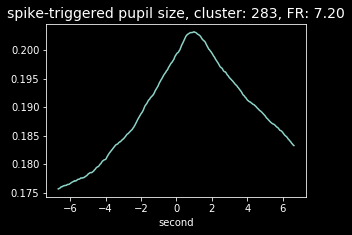

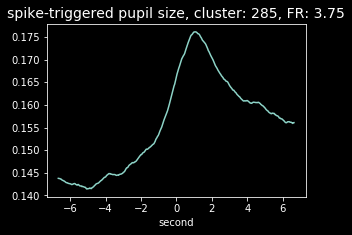

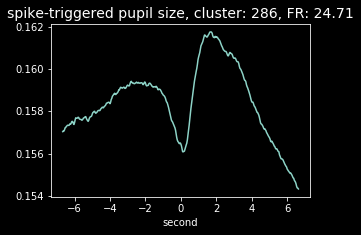

In [926]:
allSpikeTriggeredPupil = spikeTriggeredAvgPupilSize(framesStartSample,\
                                 pupilSmoothArea, spikeClustersToPlot, spikeTime, spikeClusters,\
                                                   lastCapturedFrame_Sample, spontFRs)

### spike-triggered Average of facial motion

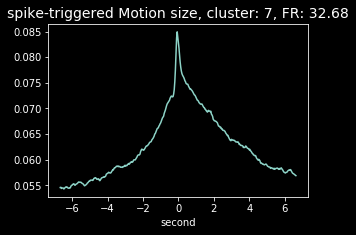

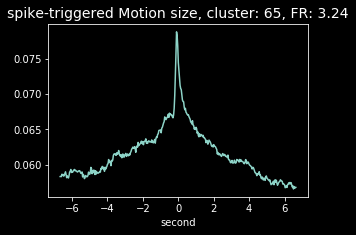

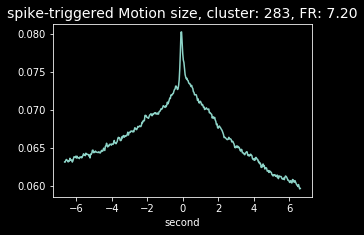

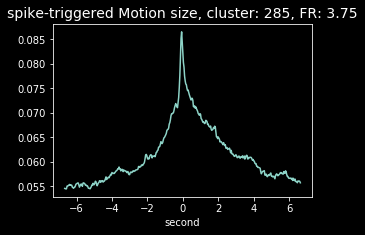

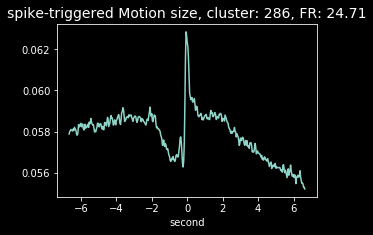

In [827]:
allSpikeTriggeredPupil = spikeTriggeredAvgFacialMovement(framesStartSample,\
                                 motion, spikeClustersToPlot, spikeTime, spikeClusters, spontFRs)

### visual responsiveness of neurons

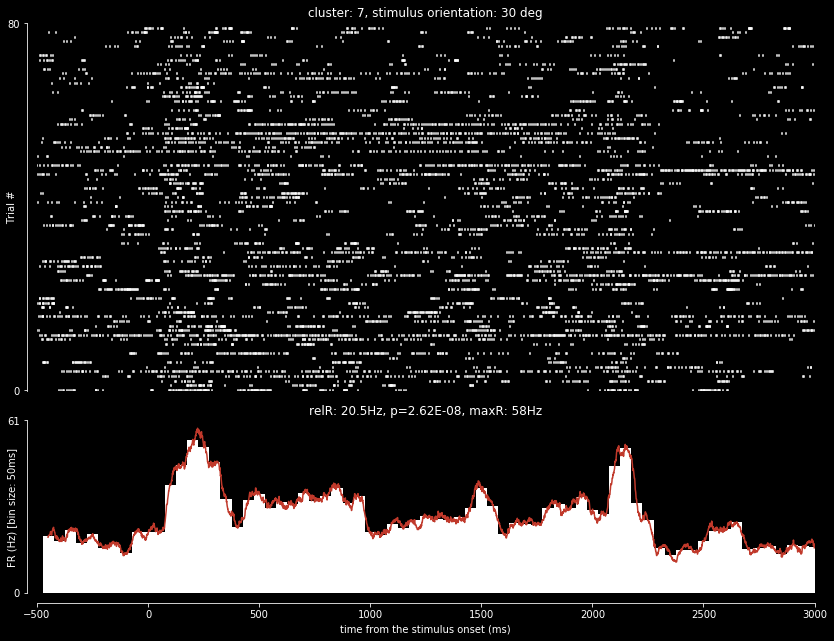

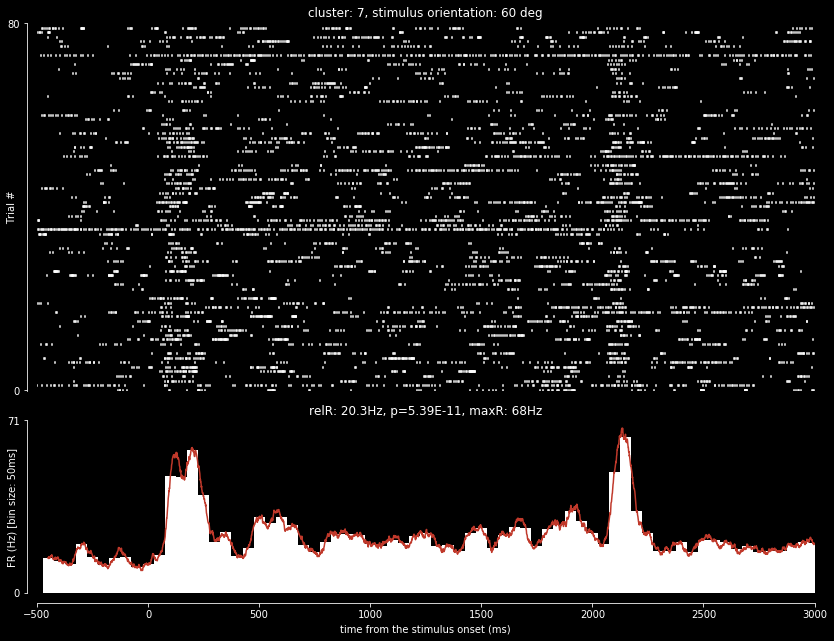

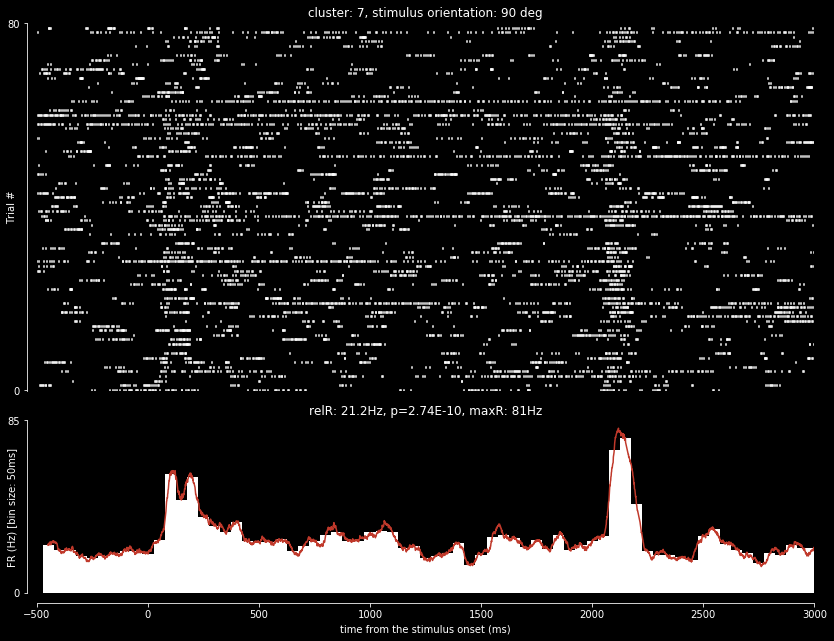

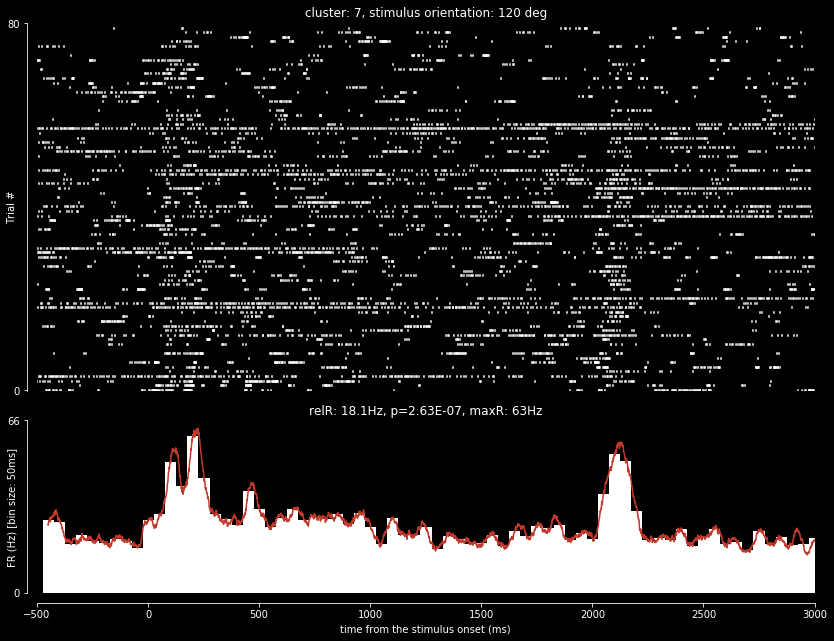

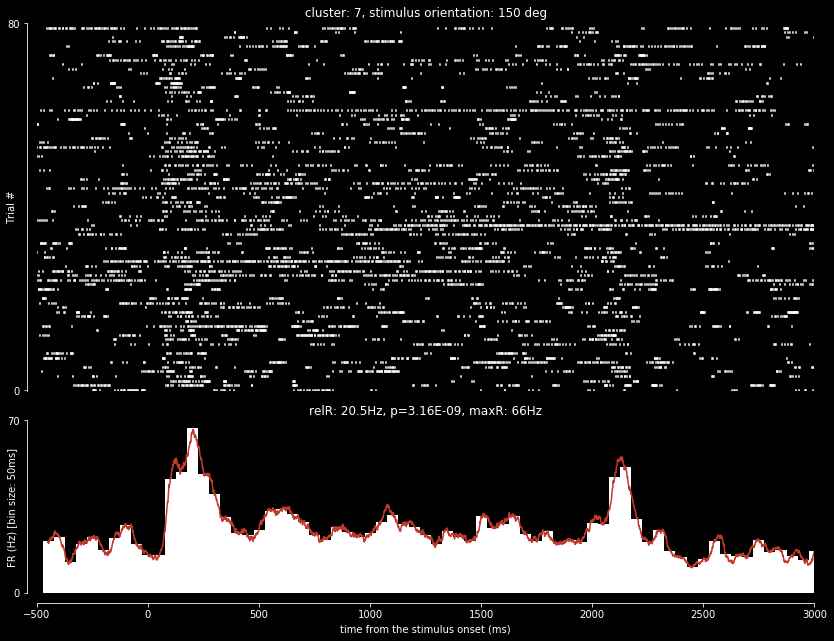

...

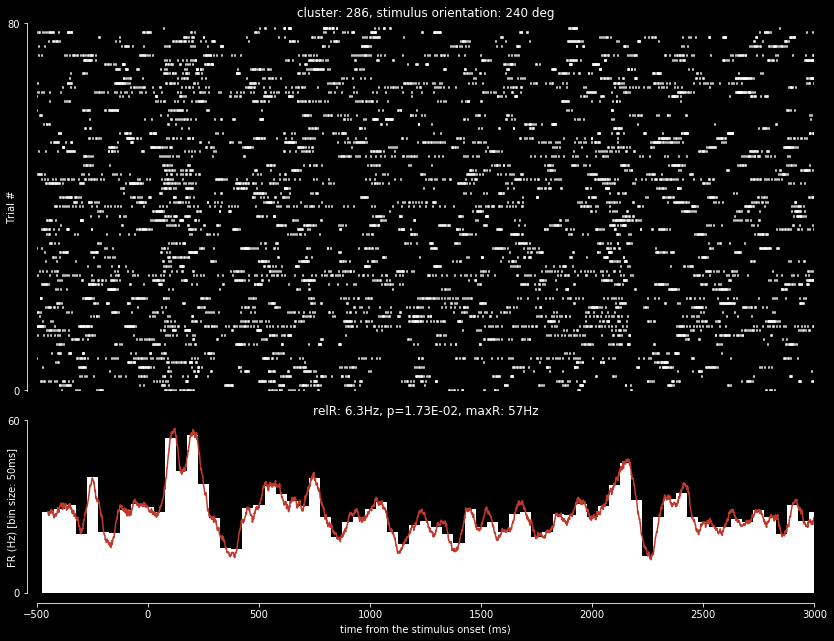

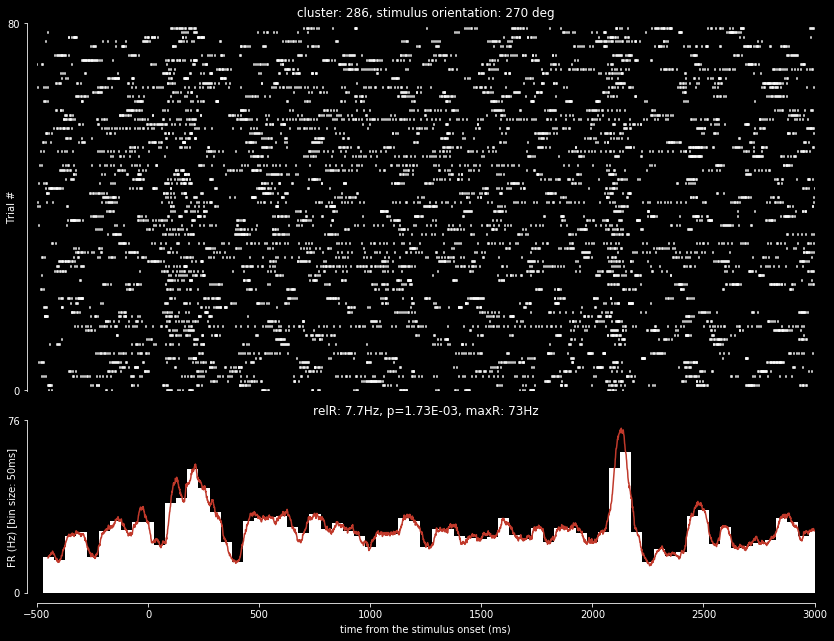

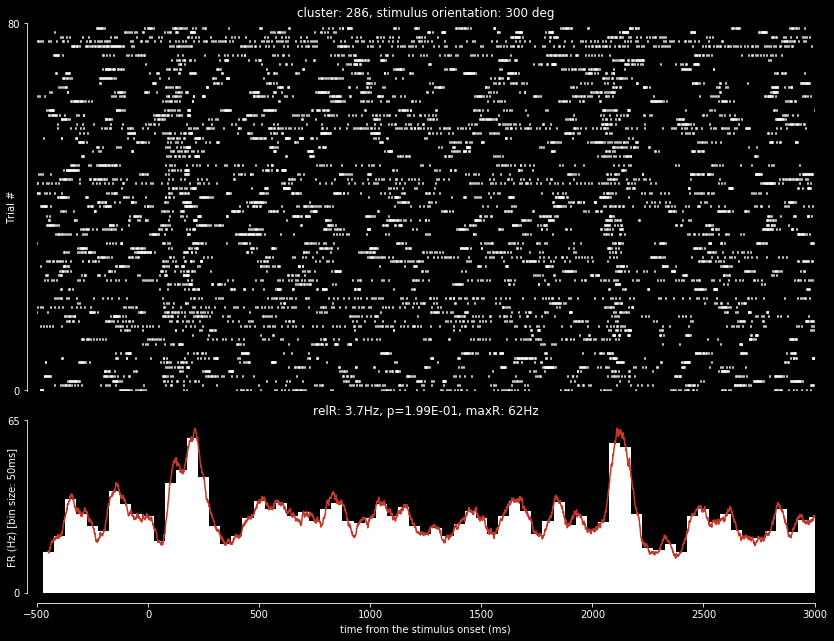

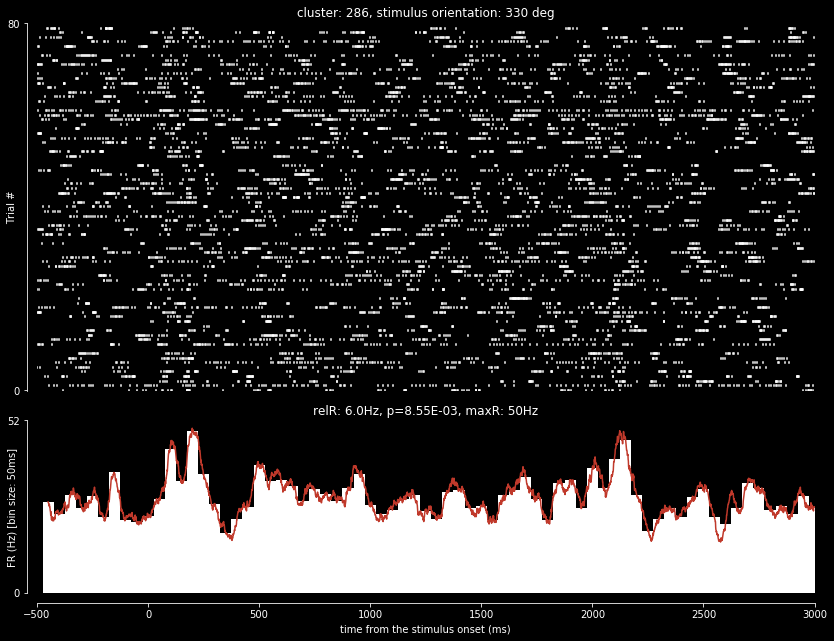

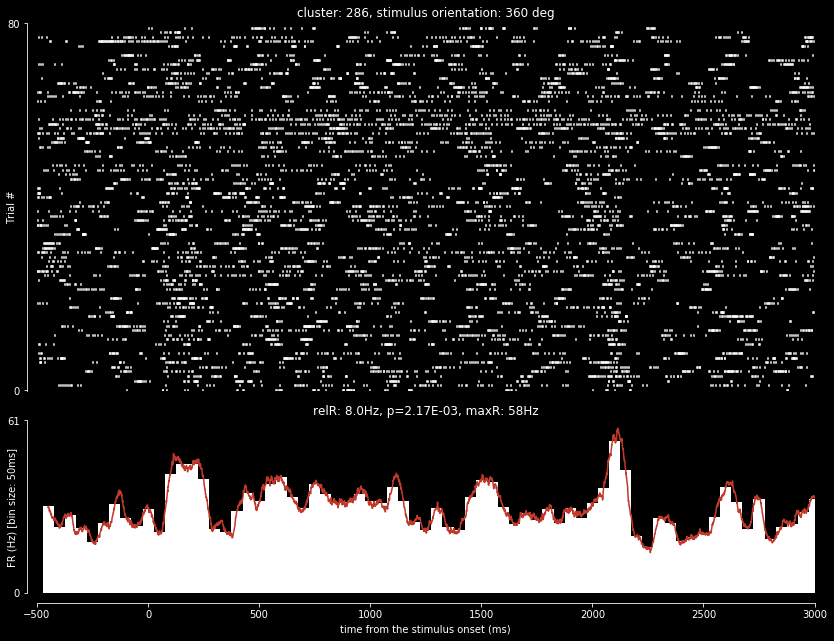

In [931]:
allClustersResponsiveness = []
allClustersBaselineCorrectedResponse = []
allClustersMaxFR_response = []
allClustersFR_responsePattern = []

for clusterNo in spikeClustersToPlot[:]:
    
    # extract the time of spikes for the cluster in this loop iteration
    clusterSpikeTime = spikeTime[np.where(spikeClusters==clusterNo)].squeeze() 
    
    responsiveness, clusterBaselineCorrectedResponse, clusterMaxResponse, clusterResponsivenessPvals,\
    FR_responsePattern, FR_responseTimePoints = \
        neuronVisualResponse(clusterSpikeTime,clusterNo,stimID,stimOnsetSample, \
                             responseWindowEnd = 3000, darkMode = darkMode);
    
    allClustersResponsiveness.append(responsiveness)
    allClustersBaselineCorrectedResponse.append(clusterBaselineCorrectedResponse)
    allClustersMaxFR_response.append(clusterMaxResponse)
    allClustersFR_responsePattern.append(FR_responsePattern)

### Tuning curve and Orienation Selectivity Index

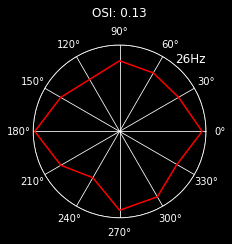

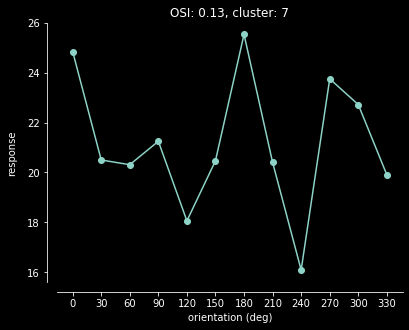

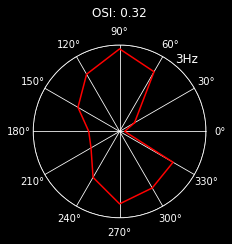

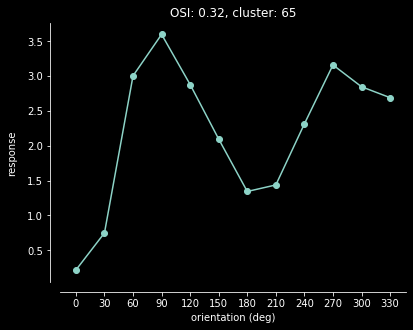

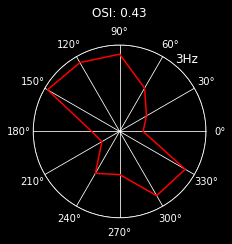

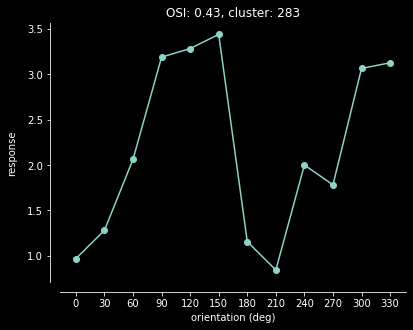

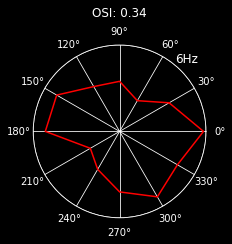

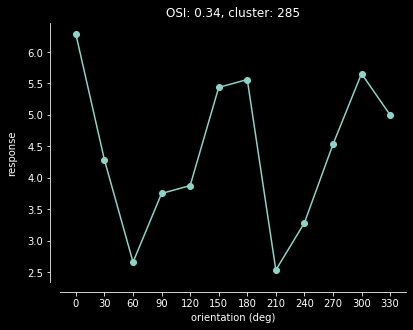

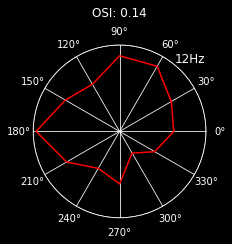

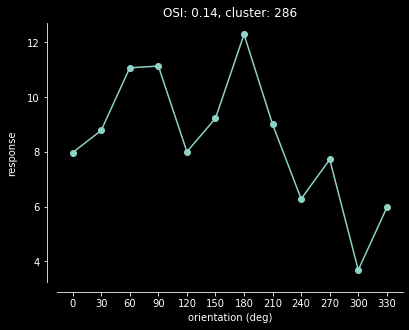

In [20]:
allOSI = []
# allOSI_max = []
for clusterCounter in range(len(spikeClustersToPlot)):
    if allClustersResponsiveness[clusterCounter]:
        allOSI.append(tuningCurveAndOSI(allClustersBaselineCorrectedResponse[clusterCounter],\
                                       spikeClustersToPlot[clusterCounter]));
#     allOSI_max.append(tuningCurveAndOSI(allClustersMaxFR_response[clusterNo]))

### Baseline and Evoked comparison between alert and non alert trials

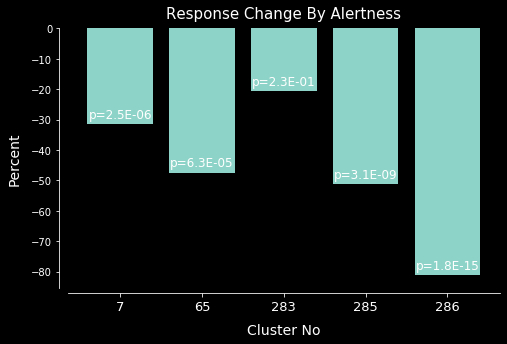

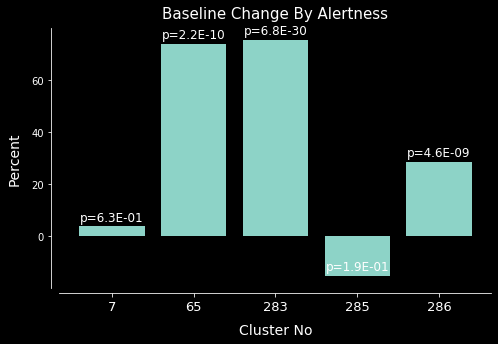

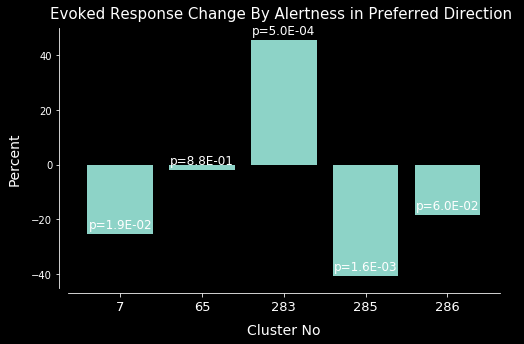

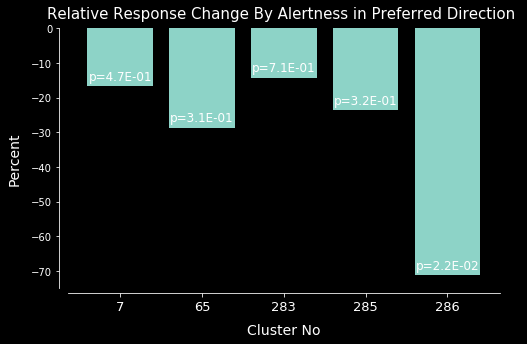

In [22]:
# Extracting the high and low-arousal level trials
lowArousalStimTrials, highArousalStimTrials = \
            extractLowAndHighArousalTrials(framesStartSample, pupilSmoothArea, stimOnsetSample,\
                timeWindowBeforeStimStart = 500,\
                timeWindowAfterStimStart = 0)

allTrialsRelResponse, allTrialsBaseline, allTrialsEvokedResponse\
                    = allTrialsResponses(spikeClusters, spikeTime, stimOnsetSample,\
                        spikeClustersToPlot[np.where(allClustersResponsiveness)])

# response change by alertness

allClustersNormalizedArousalResponseChange, allPvalArousalResponseDiff = responseChangeByAlertness(\
            spikeClustersToPlot[np.where(allClustersResponsiveness)],\
            allTrialsRelResponse,highArousalStimTrials,lowArousalStimTrials)

# Basline change by alertness
allClustersNormalizedArousalBaselineChange, allPvalaselineChange = responseChangeByAlertness(\
            spikeClustersToPlot[np.where(allClustersResponsiveness)],\
            allTrialsBaseline,highArousalStimTrials,lowArousalStimTrials,\
            figTitle = 'Baseline Change By Alertness')

# Evoked response change in the preferred stim by alertness
evokedResponseChangeByArousa, pvalEvokedResponseChange = \
bestOrienationResponseChangeByAlertness(spikeClustersToPlot,allTrialsEvokedResponse,\
    highArousalStimTrials,lowArousalStimTrials,allClustersBaselineCorrectedResponse,\
    allClustersResponsiveness,stimID,figTitle = 'Evoked Response Change By Alertness in Preferred Direction ');

# relative response change in the preferred stim by alertness
bestDirectionRelResponseChangeByArousal, pvalBestDirectionResponseChange = \
bestOrienationResponseChangeByAlertness(spikeClustersToPlot,allTrialsRelResponse,\
    highArousalStimTrials,lowArousalStimTrials,allClustersBaselineCorrectedResponse,\
    allClustersResponsiveness,stimID,figTitle = 'Relative Response Change By Alertness in Preferred Direction ');

### Tuning Curve and OSI between Alert and non Alert

Text(0.5, 1.0, 'OSI change with alertness')

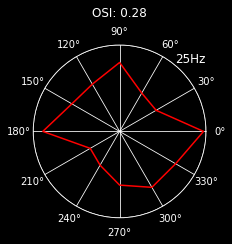

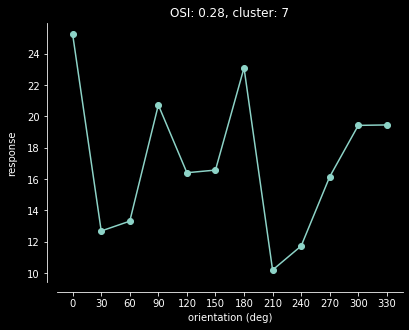

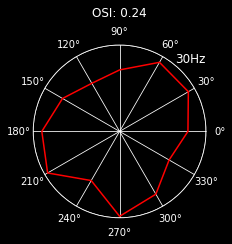

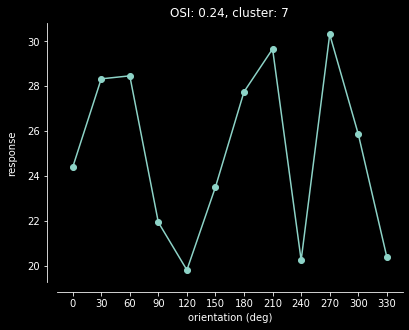

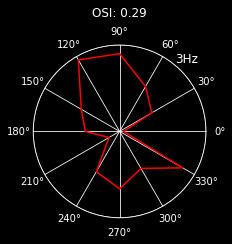

...

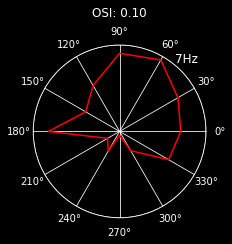

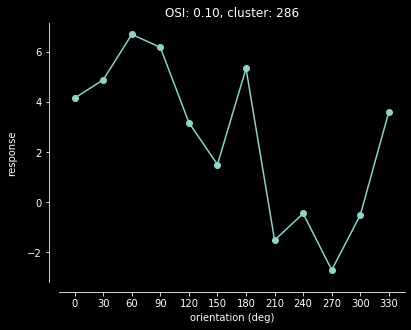

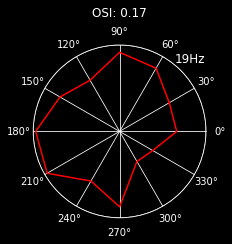

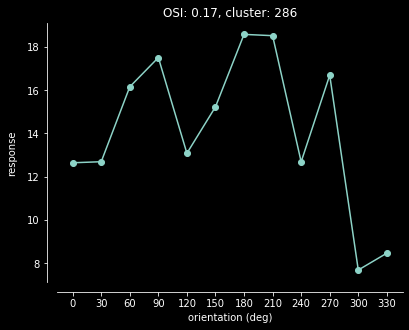

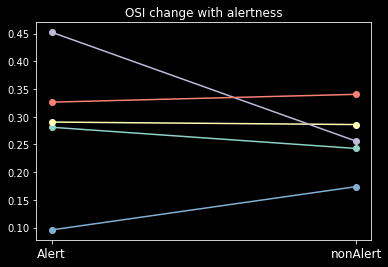

In [23]:
allClustersAlertMeanOrientationResponse = []
allClustersNonAlertMeanOrientationResponse = []
OSI_Alert = []
OSI_nonAlert = []
for clusterCounter in range(len(np.where(allClustersResponsiveness)[0])):

    alertMeanOrientationResponse = []
    nonAlertMeanOrientationResponse = []
    for orientationCounter in np.unique(stimID):

        alertResponseCluster = allTrialsRelResponse[clusterCounter]\
                            [np.intersect1d(np.where(stimID==orientationCounter)[0], highArousalStimTrials)]

        nonAlertResponseCluster = allTrialsRelResponse[clusterCounter]\
                            [np.intersect1d(np.where(stimID==orientationCounter)[0], lowArousalStimTrials)]

        alertMeanOrientationResponse.append(np.mean(alertResponseCluster))
        nonAlertMeanOrientationResponse.append(np.mean(nonAlertResponseCluster))
        
    allClustersAlertMeanOrientationResponse.append(alertMeanOrientationResponse)
    allClustersNonAlertMeanOrientationResponse.append(nonAlertMeanOrientationResponse)
#         print(stats.ttest_ind(alertResponseCluster,nonAlertResponseCluster)[1],\
#              np.mean(alertResponseCluster),np.mean(nonAlertResponseCluster))
    
    OSI_Alert.append(tuningCurveAndOSI(alertMeanOrientationResponse,\
                                       spikeClustersToPlot[clusterCounter]))
    OSI_nonAlert.append(tuningCurveAndOSI(nonAlertMeanOrientationResponse,\
                                          spikeClustersToPlot[clusterCounter]))
    
plt.figure()
plt.plot([1,2],np.array([OSI_Alert,OSI_nonAlert]),'o-')
plt.xticks([1,2],(['Alert','nonAlert']),fontsize=12)
plt.title('OSI change with alertness')

### noise correlation between alert and non-alert trials

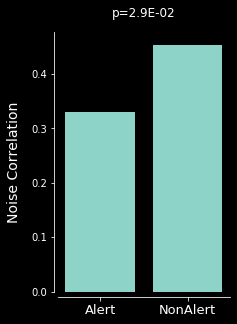

In [26]:
noiseCorrAlert, noiseCorrNonAlert, pval = noiseCorrBetweenAlertAndNonAlertTrials\
        (allTrialsRelResponse,highArousalStimTrials,lowArousalStimTrials)

# print(stats.ttest_ind(noiseCorrAlert,noiseCorrNonAlert)[1],np.mean(noiseCorrAlert)\
#               ,np.mean(noiseCorrNonAlert))

### power Spectrum across layers

#### estimated L5 channel

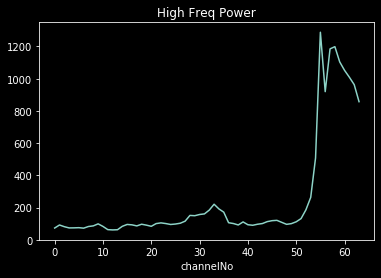

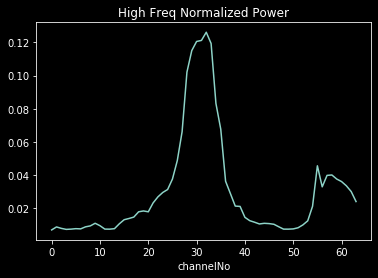

In [480]:
# the address to the data file (the original reordered or re-referenced recordered)
dataFileAddReorderRereferenced = dataFileBaseFolder + '/' + 'amplifierReorderRereferencedMedian.dat'

# the estimation of L5 based on the power in 500-5000 Hz band
L5channelNo, allChannelsNormHighFreqPower,\
        allChannelsHighFreqPower = estimatedL5chnnael(dataFileAddReorderRereferenced,\
                                                      firstBeforeStimTagSampleNo)

# the estimation of the L4 and L2/3 based on the estimated position for L5
L4channelNo = L5channelNo - 8
L23channelNo = L5channelNo - 15

### reading low pass filtered data file

In [521]:
dataFile = open(dataFileBaseFolder + '/' + 'amplifierReorderRereferencedLowPass.dat' , 'rb')
dataArray = np.fromfile(dataFile,dtype='int16')
dataFile.close()

del dataFile

dataMatrixReorderLowPassFiltered = np.reshape(dataArray, (int(dataArray.shape[0]/channelsNo), channelsNo)).T

del dataArray

#### power spectrum across layers during spontaneous activity

1136.9715928049334
2803.1298701099
5616.88586808699


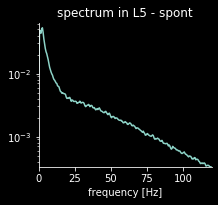

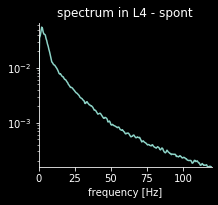

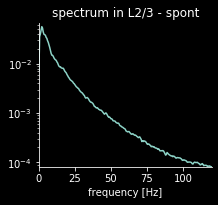

In [522]:
# the spontaneous activity is recorded at the begining of the session and the varialbe 
# "firstBeforeStimTagSampleNo" that indicate the first visual stimulus is used to extract the last moment
# of the spontaneous activity

spontEndTime = firstBeforeStimTagSampleNo/fs # in seconds

# the reduced sampling rate used to generated low-pass filtered LFP
reducedSamplingRate = 2e3

# the resolution of power spectrum
df = 0.5

# extracting the spont activity on L5 channel and conversion to microVolts by multiplying to 0.195
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]\
                                 [:int(spontEndTime*reducedSamplingRate)]*0.195

# power spectrum L5
f_powerSpectrum, powerSpectrumL5, estimatedTotalPower = \
            powerSpectrumSingleChannel(inputSignalToFreqAnalysis,reducedSamplingRate\
                                          ,figToShow = True,\
maxFreqToShow = 120, freqRes = df, Normalized = 1, figTitle = 'spectrum in L5 - spont' )

print(estimatedTotalPower)

# extracting the spont activity on L4 channel and conversion to microVolts by multiplying to 0.195
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L4channelNo]\
                                 [:int(spontEndTime*reducedSamplingRate)]*0.195
# power spectrum L4
f, powerSpectrumL4, estimatedTotalPower = \
            powerSpectrumSingleChannel(inputSignalToFreqAnalysis,reducedSamplingRate\
                                          ,figToShow = True,\
maxFreqToShow = 120, freqRes = df, Normalized = 1, figTitle = 'spectrum in L4 - spont' )
print(estimatedTotalPower)

# extracting the spont activity on L2/3 channel and conversion to microVolts by multiplying to 0.195
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L23channelNo]\
                                 [:int(spontEndTime*reducedSamplingRate)]*0.195
# power spectrum L2/3
f, powerSpectrumL23, estimatedTotalPower = \
            powerSpectrumSingleChannel(inputSignalToFreqAnalysis,reducedSamplingRate\
                                          ,figToShow = True,\
maxFreqToShow = 120, freqRes = df, Normalized = 1, figTitle = 'spectrum in L2/3 - spont' )
print(estimatedTotalPower)

## Facial Movement, Pupil and Alertness

#### reading the facemap results

In [489]:
from tkinter import Tk
from tkinter.filedialog import askopenfilename

root = Tk()
root.withdraw()

# select the the facemap output file .npy
videoDataFileAdd =  askopenfilename(initialdir = dataFileBaseFolder,title = "Select file",\
                            filetypes = (("facemap output file","*.npy"),("all files","*.*")))

# loading the data file
proc = np.load(videoDataFileAdd,allow_pickle=True).item()

# loading the facial movement in variable 'motion' which is the difference between consecutive frames 
motion = proc['motion'][1]

# loading the pupil area in variable "pupilSmoothArea"
pupilSmoothArea = proc['pupil'][0]['area_smooth']

### defining a criteria for alertness based on the distribution of pupil sizes

the proportion time that animal has been alert: 0.310491371292756


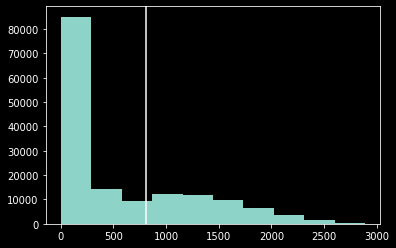

In [488]:
# alertness threshold: first estimate the maximum of the pupil area --> 90 percent of the pupil area distribution
# and define the alertness as the half of this value, and check how much time animal has been alert
plt.hist(pupilSmoothArea)
# plt.axvline(0.3*np.max(pupilSmoothArea))
alertnessThreshold = np.percentile(pupilSmoothArea,90)*0.5
plt.axvline(alertnessThreshold)

print('the proportion time that animal has been alert:',\
      len(pupilSmoothArea[pupilSmoothArea>alertnessThreshold])/len(pupilSmoothArea))

### smoothing the motion signal by calculating the average energy across moving windows

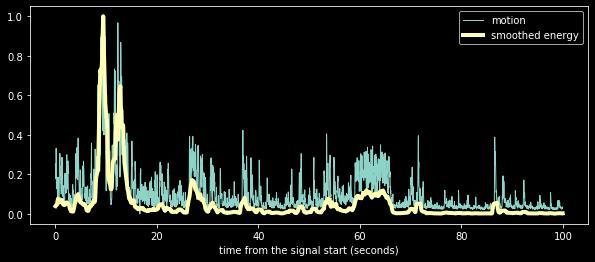

In [661]:
cameraAvgFrameRate = 30

# width of averging window
avgWindowWidth = 1
avgWindowWidthFrameNo = avgWindowWidth * cameraAvgFrameRate

# convolving the motion energy with a rectangular window to get moving average
movingWindowEnergy = np.convolve(motion**2,np.ones(avgWindowWidthFrameNo),'same')/avgWindowWidthFrameNo

# movingWindowEnergy = np.concatenate((np.zeros(int(avgWindowWidthFrameNo/2))\
#                                      ,movingWindowEnergy))[:len(motion)]

# comparing the original motion signal and smoothed motion energy
startTime = 0
endTime = 100
temporalPlot(motion/max(motion),startTime,endTime,30,figuresize=(10,4))
# plt.figure()
temporalPlot(movingWindowEnergy/max(movingWindowEnergy),startTime,endTime,30,linewidth=4)

plt.legend(['motion','smoothed energy'])

# plt.figure()
# temporalPlot(pupilSmoothArea/max(pupilSmoothArea),startTime,endTime,30)

### comparing the pupil signal, facial movement and locomotion

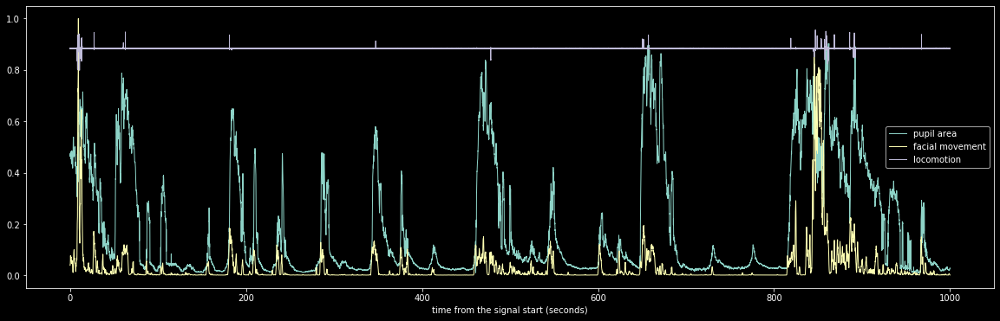

In [663]:
startTime = 0
endTime = 1000

temporalPlot(pupilSmoothArea/max(pupilSmoothArea),startTime,endTime,30,figuresize=(20,6))


temporalPlot(movingWindowEnergy/max(movingWindowEnergy),startTime,endTime,30)

# plt.figure()


# firstFrameTime = firstCapturedFrame_Sample/fs

temporalPlot(wheelSensorSignal[firstCapturedFrame_Sample:]/max(wheelSensorSignal),startTime,\
             endTime,fs)

plt.legend(['pupil area','facial movement','locomotion'])

### defining a criteria for movement

the proportion time that animal has been moving with this criteris: 34%


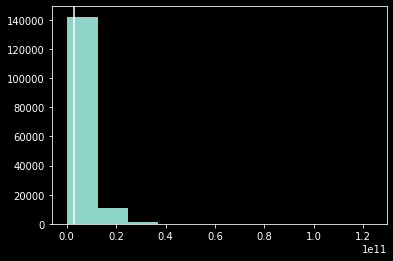

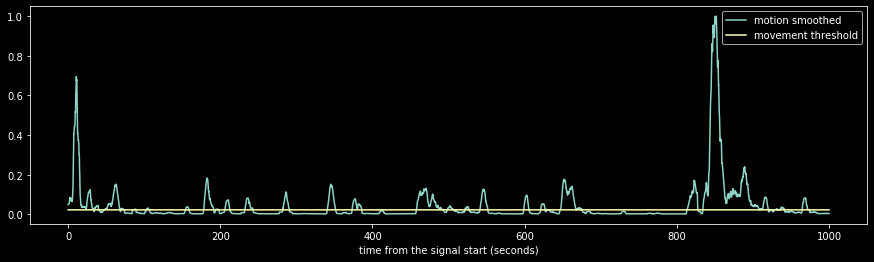

In [506]:
plt.hist(movingWindowEnergy)

# a fraction of 90% percentile
movementThreshold = np.percentile(movingWindowEnergy,90)*0.25
plt.axvline(movementThreshold)

print('the proportion time that animal has been moving with this criteris: %(number)d%%' %{'number':\
      100*len(movingWindowEnergy[movingWindowEnergy>movementThreshold])/len(movingWindowEnergy)})

startTime = 0
endTime = 1000
temporalPlot(movingWindowEnergy/max(movingWindowEnergy),startTime,endTime,30,figuresize=(15,4))

temporalPlot(movementThreshold*np.ones(len(movingWindowEnergy))/max(movingWindowEnergy),\
             startTime,endTime,30)

plt.legend(['motion smoothed','movement threshold'])


### detecting the consecutive periods of movement

In [524]:
# This is to extract the epochs of movement and non-movement during spont activity
# movement criteria is set based on the movementThreshold calculated above
# to consider an epoch for movement or non-movement, it should be at least "minimumConsistentStateDur"
# seconds long

minimumConsistentStateDur = 2

alertChoosedEpochsStarts, alertChoosedEpochsEnds, nonAlertChoosedEpochsStarts, \
    nonAlertChoosedEpochsEnds = exctractAlertAndNonAlertPeriods(movingWindowEnergy,framesStartSample,\
                0,spontEndTime, minimumConsistentStateDur = minimumConsistentStateDur,\
                alertnessThreshold = movementThreshold)

#### checking the LFP around the time of movement start

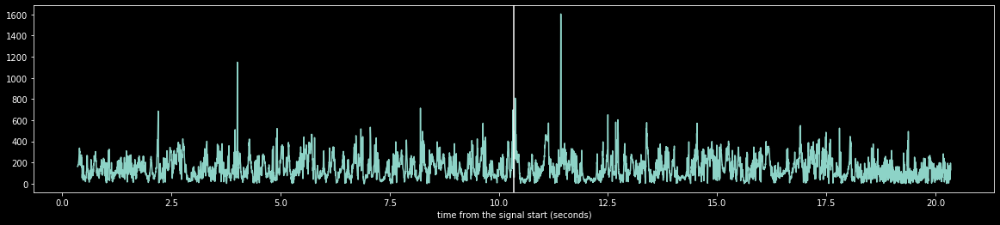

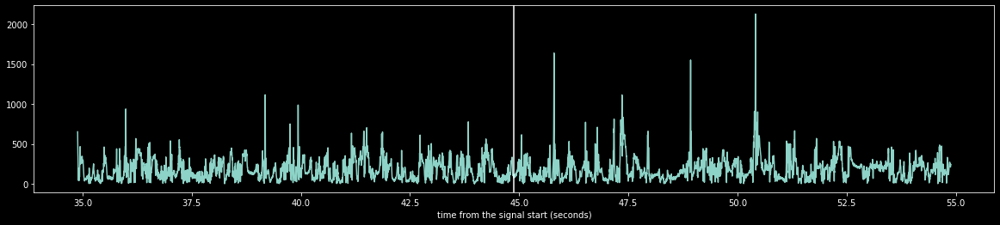

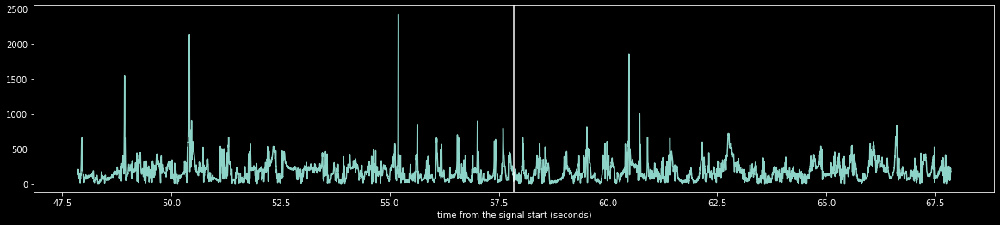

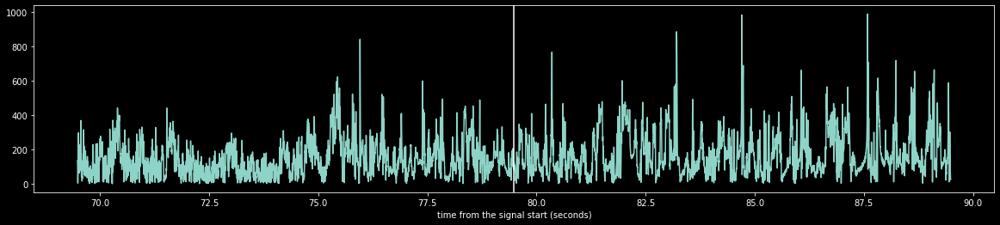

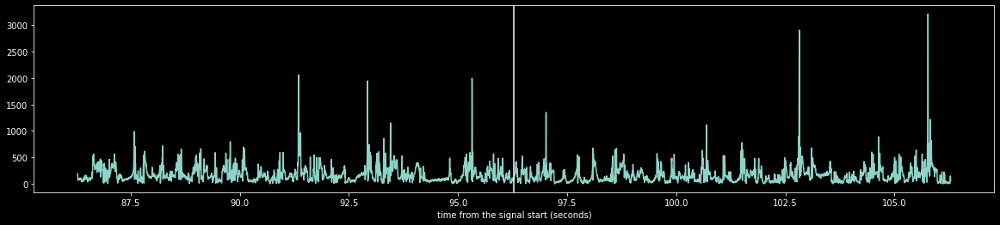

...

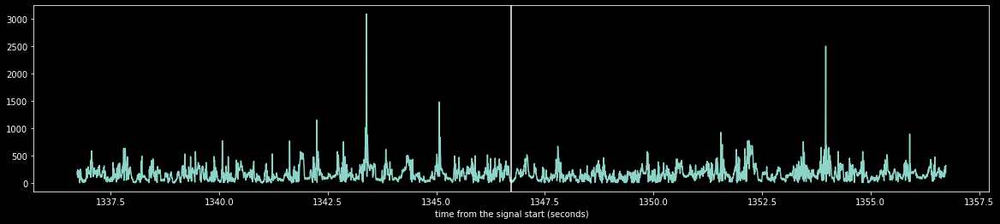

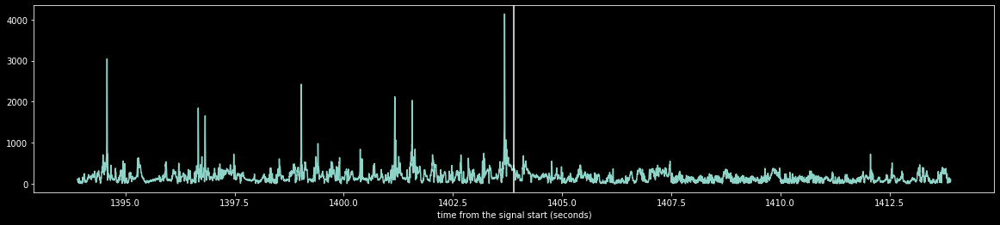

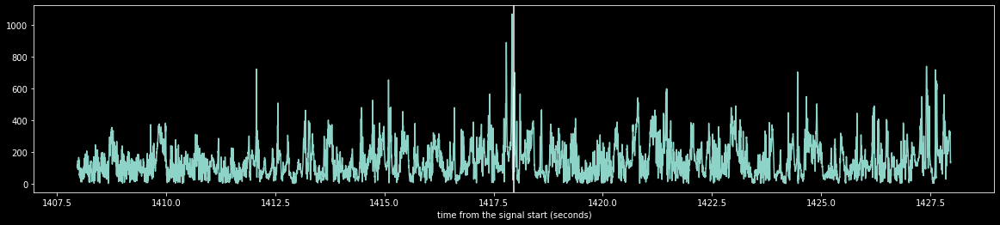

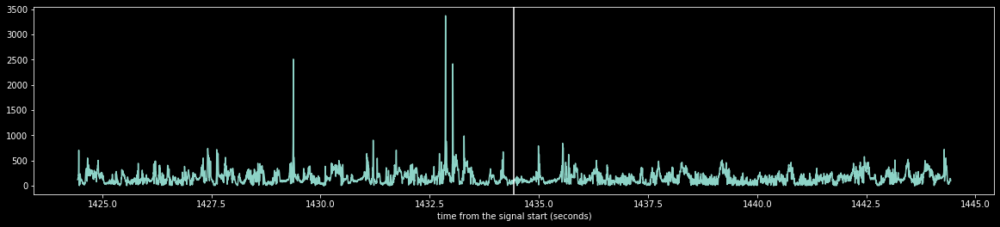

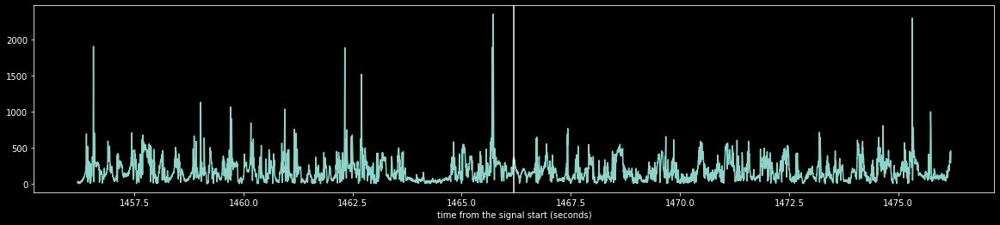

In [614]:
from scipy.signal import hilbert

windowToShow = 20
reducedSamplingRate = 2e3

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

# lowFreqBand = 1
highFreqBand = 150
inputSignalToFreqAnalysis = butter_lowpass_filter(inputSignalToFreqAnalysis,\
                                highFreqBand,reducedSamplingRate)

hilbertTransformedSig = hilbert(inputSignalToFreqAnalysis)
ampTransformedSig = np.abs(hilbertTransformedSig)

for alertMovementEpochCounter in range(len(alertChoosedEpochsStarts)):
    
    movementTime = framesStartSample[alertChoosedEpochsStarts[alertMovementEpochCounter]]/fs
#     epochEndTime = framesStartSample[alertChoosedEpochsEnds[alertMovementEpochCounter]]/fs
    
    epochStartTime = movementTime - windowToShow/2
    epochEndTime = movementTime + windowToShow/2
    
#     plt.figure()
#     temporalPlot(inputSignalToFreqAnalysis,epochStartTime,epochEndTime,reducedSamplingRate,\
#                 figuresize=(20,4),figNo=alertMovementEpochCounter)
    temporalPlot(ampTransformedSig,epochStartTime,epochEndTime,reducedSamplingRate,\
                figuresize=(20,4),figNo=alertMovementEpochCounter)
    plt.axvline(movementTime)

### power spectrum between movement and non-movement periods

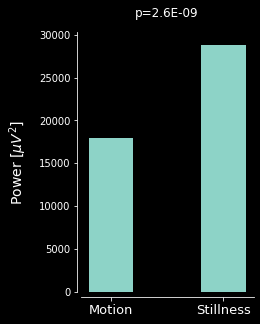

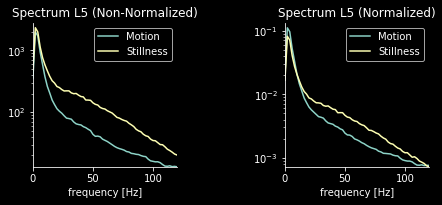

In [781]:
timToExclude = 0 

df = 2 #in Hz; spectrum resolution

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]
f_spectrumL5, motionSpectrumL5Abs, stillnessSpectrumL5Abs, motionTotalPowerL5, stillnessTotalPowerL5\
            = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = df, figTitle = 'Spectrum L5')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L4channelNo]
f, alertSpectrumL4, nonAlertSpectrumL4 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = df, figTitle = 'Spectrum L4')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L23channelNo]
f, alertSpectrumL23, nonAlertSpectrumL23 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = df, figTitle = 'Spectrum L2/3')

### compare the bands between motion and stillness

#### Total  gamma Power

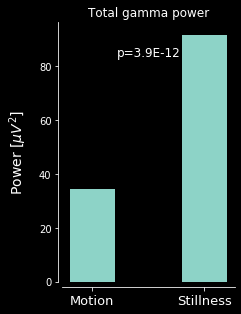

In [687]:
lowBand = 30
highBand = 70

motionStillnessPowerCompare(motionSpectrumL5Abs, stillnessSpectrumL5Abs, lowBand, highBand,\
                                df, figTitle='Total gamma power')

#### Total 0-10 Hz Power

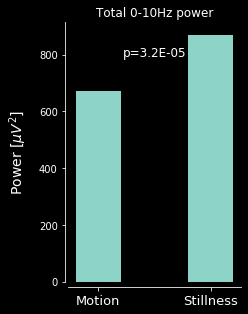

In [689]:
lowBand = 0
highBand = 10

motionStillnessPowerCompare(motionSpectrumL5Abs, stillnessSpectrumL5Abs, lowBand, highBand,\
                                df, figTitle='Total 0-10Hz power')

#### Relative gamma power

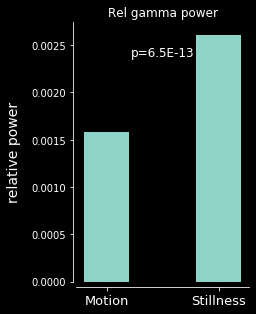

In [702]:
lowBand = 30
highBand = 70

relativeMotionPower = np.array([motionSpectrumL5Abs[epochCounter]/motionTotalPowerL5[epochCounter]\
                              for epochCounter in range(len(motionSpectrumL5Abs))])

relativeStillnessPower = np.array([stillnessSpectrumL5Abs[epochCounter]/stillnessTotalPowerL5[epochCounter]\
                              for epochCounter in range(len(stillnessSpectrumL5Abs))])

motionStillnessPowerCompare(relativeMotionPower,\
                            relativeStillnessPower, lowBand, highBand,\
                                df, figTitle='Rel gamma power',relPower=1)

#### Relative 0-10Hz power

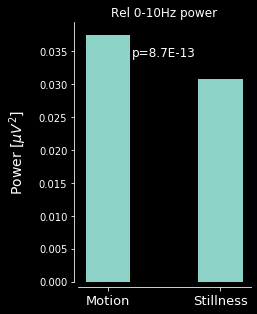

In [701]:
lowBand = 0
highBand = 10

relativeMotionPower = np.array([motionSpectrumL5Abs[epochCounter]/motionTotalPowerL5[epochCounter]\
                              for epochCounter in range(len(motionSpectrumL5Abs))])

relativeStillnessPower = np.array([stillnessSpectrumL5Abs[epochCounter]/stillnessTotalPowerL5[epochCounter]\
                              for epochCounter in range(len(stillnessSpectrumL5Abs))])

motionStillnessPowerCompare(relativeMotionPower,\
                            relativeStillnessPower, lowBand, highBand,\
                                df, figTitle='Rel 0-10Hz power',relPower=1)

#### average hilbert amp across each frame

In [581]:
# adding the end of the last frame to the frame start vector
framesStartSampleCorrected = np.append(framesStartSample, framesStartSample[-1]\
                                       +int(fs/cameraAvgFrameRate))

# this should be with reduced sampling rate because we want to average on LFP which has been subsampled
framesStartSampleCorrectedReducedRate = (framesStartSampleCorrected*reducedSamplingRate/fs).astype('int')
# the below vector shows the boundries of the frames by intan sameple number 
framesBoundsSamples = np.array([framesStartSampleCorrectedReducedRate[:-1],\
                                framesStartSampleCorrectedReducedRate[1:]]).T

# averaging the amplitude of the hilbert in each frame, so the output vector is the same size as 
# the movement extracted for each frame
ampHilTransformedFrameAvg = np.array([np.mean(ampTransformedSig\
            [frameBounds[0]:frameBounds[1]]) for frameBounds in \
                            framesBoundsSamples])

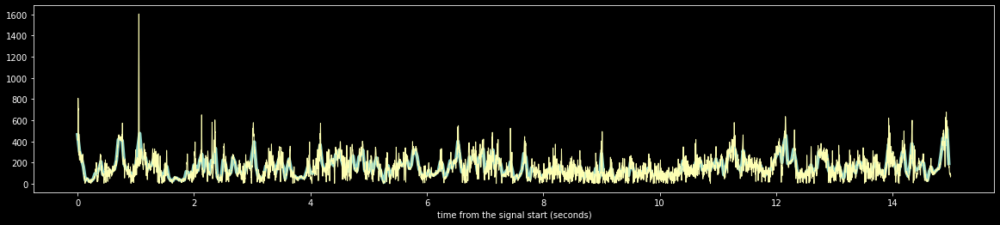

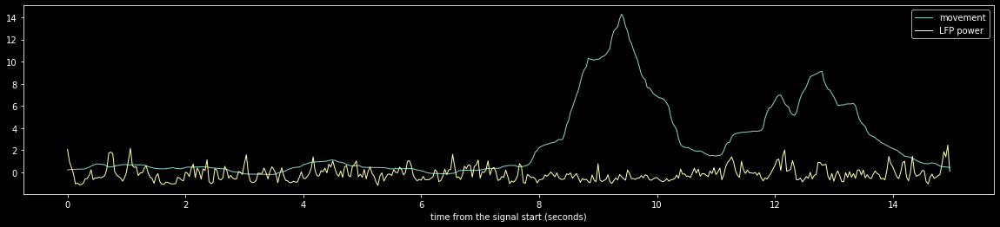

In [789]:
startTime = 0
endTime = startTime + 15
temporalPlot(ampHilTransformedFrameAvg[:],startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),linewidth=4)

temporalPlot(ampTransformedSig[\
    int(firstCapturedFrame_Sample*reducedSamplingRate/fs) + int(reducedSamplingRate/cameraAvgFrameRate/2)\
                               :],startTime,endTime,\
             reducedSamplingRate,figuresize=(20,4))



temporalPlot(stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity]),startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=1)

temporalPlot(stats.zscore(ampHilTransformedFrameAvg[:lastFrameDuringSpontActivity]),startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=1)

plt.legend(['movement','LFP power'])

### cross correlogram of LFP power with movement during spont activity

#### broad-band LFP and motion

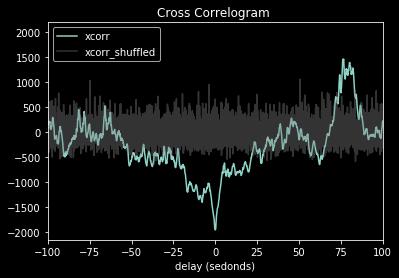

In [780]:
# input signal being the LFP from the estimated channel in L5
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

# the frequency bands of filiering the LFP 
lowFreqBand = 0
highFreqBand = 150

# computing the hilbert transform of the filtered LFP and then average the magnitude of the hilbert
# in each frame so to caculate the crosscorrelogram between motion and LFP power
ampHilTransformedFrameAvgBroadBand = hilbertTransformedLFP_FrameRateAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

powerInEachFramBroadBand = powerLFP_FrameAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(powerInEachFramBroadBand[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100)

#### 30-70 Hz LFP and motion 

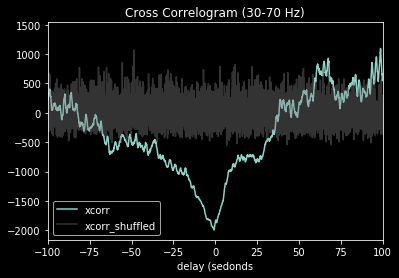

In [759]:
# input signal being the LFP from the estimated channel in L5
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

# the frequency bands of filiering the LFP 
lowFreqBand = 30
highFreqBand = 70

# computing the hilbert transform of the filtered LFP and then average the magnitude of the hilbert
# in each frame so to caculate the crosscorrelogram between motion and LFP power
ampHilTransformedFrameAvgGamma = hilbertTransformedLFP_FrameRateAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

powerInEachFramGamma = powerLFP_FrameAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(powerInEachFramGamma[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100,figTitle='(30-70 Hz)')

#### 0-10 Hz LFP and motion

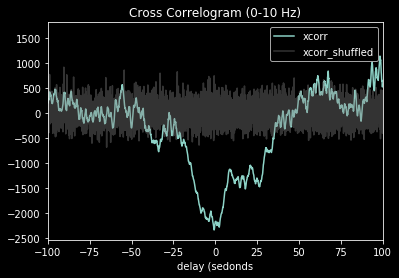

In [761]:
# input signal being the LFP from the estimated channel in L5
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

# the frequency bands of filiering the LFP 
lowFreqBand = 0
highFreqBand = 10

# computing the hilbert transform of the filtered LFP and then average the magnitude of the hilbert
# in each frame so to caculate the crosscorrelogram between motion and LFP power
ampHilTransformedFrameAvg_10Hz = hilbertTransformedLFP_FrameRateAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

powerInEachFram_10Hz = powerLFP_FrameAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(powerInEachFram_10Hz[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100,figTitle='(0-10 Hz)')

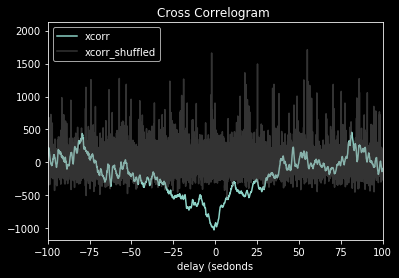

In [765]:
# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(powerInEachFramGamma[:lastFrameDuringSpontActivity]/\
                       powerInEachFramBroadBand[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100,figTitle='')

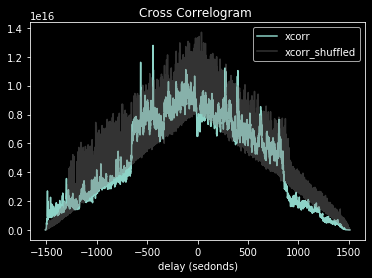

In [777]:
# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(powerInEachFramGamma[:lastFrameDuringSpontActivity]/\
                       powerInEachFram_10Hz[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100,figTitle='')

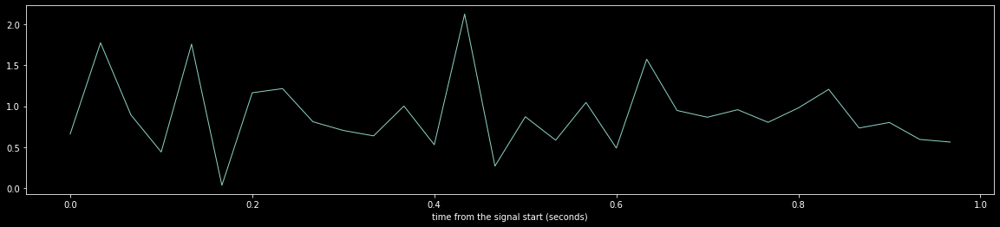

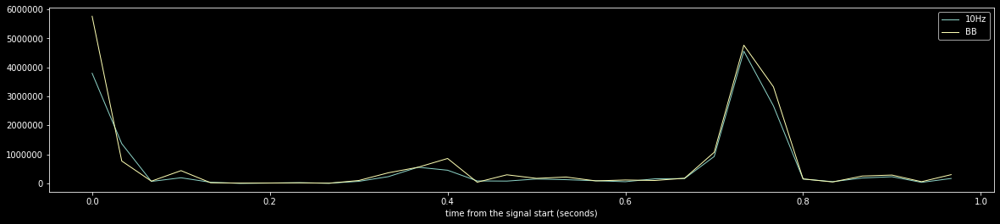

In [768]:
startTime = 0
endTime = startTime + 1

temporalPlot(powerInEachFram_10Hz/powerInEachFramBroadBand,startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=0)

temporalPlot(powerInEachFram_10Hz,startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=1)

temporalPlot(powerInEachFramBroadBand,startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=1)

plt.legend(['10Hz','BB'])

(array([1.54408e+05, 3.23000e+02, 5.30000e+01, 2.30000e+01, 1.10000e+01,
        5.00000e+00, 3.00000e+00, 3.00000e+00, 2.00000e+00, 1.00000e+00]),
 array([9.67264301e-05, 1.29829632e+01, 2.59658297e+01, 3.89486962e+01,
        5.19315627e+01, 6.49144292e+01, 7.78972958e+01, 9.08801623e+01,
        1.03863029e+02, 1.16845895e+02, 1.29828762e+02]),
 <a list of 10 Patch objects>)

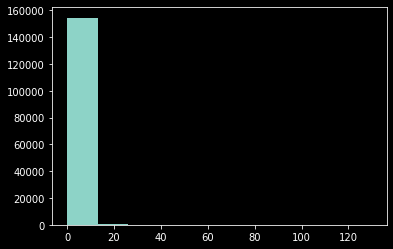

In [778]:
plt.hist(powerInEachFram_10Hz/powerInEachFramBroadBand)

In [726]:
from scipy.signal import hilbert
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

hilbertTransformedSig = hilbert(inputSignalToFreqAnalysis)
ampTransformedSigBroadBandSignal = np.abs(hilbertTransformedSig)

highFreqBand = 10

#     inputSignalToFreqAnalysis = butter_bandpass_filter(inputSignalToFreqAnalysis,\
#                             np.array([lowFreqBand,highFreqBand]),reducedSamplingRate)
# else:
lowPassFilteredSig = butter_lowpass_filter(inputSignalToFreqAnalysis,\
                        highFreqBand,reducedSamplingRate)


hilbertTransformedSig = hilbert(lowPassFilteredSig)
ampTransformedSig_10Hz = np.abs(hilbertTransformedSig)

(array([1.0410749e+07, 1.1000000e+01, 4.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.0000000e+00, 1.0000000e+00]),
 array([7.40078486e-04, 1.75870604e+03, 3.51741133e+03, 5.27611663e+03,
        7.03482192e+03, 8.79352722e+03, 1.05522325e+04, 1.23109378e+04,
        1.40696431e+04, 1.58283484e+04, 1.75870537e+04]),
 <a list of 10 Patch objects>)

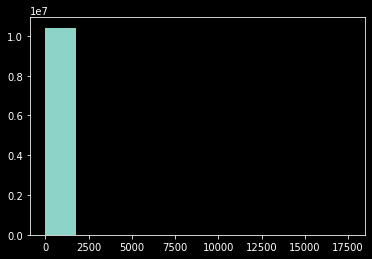

In [747]:
plt.hist(ampTransformedSig_10Hz[:firstBeforeStimTagSampleNo]/\
       ampTransformedSigBroadBandSignal[:firstBeforeStimTagSampleNo])
# plt.figure()
# # plt.plot(ampTransformedSig_10Hz[:firstBeforeStimTagSampleNo])
# # plt.figure()
# plt.plot(ampTransformedSigBroadBandSignal[:firstBeforeStimTagSampleNo])

In [786]:
inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]

# the frequency bands of filiering the LFP 
lowFreqBand = 0
highFreqBand = 150


ampHilTransformedFrameAvgBroadBand = hilbertTransformedLFP_FrameRateAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

powerInEachFramBroadBand = powerLFP_FrameAvg(inputSignalToFreqAnalysis,\
                                                               lowFreqBand,highFreqBand,\
                reducedSamplingRate,framesStartSample,cameraAvgFrameRate,fs)

In [787]:
np.mean(powerInEachFramBroadBand)

29163.176182164785

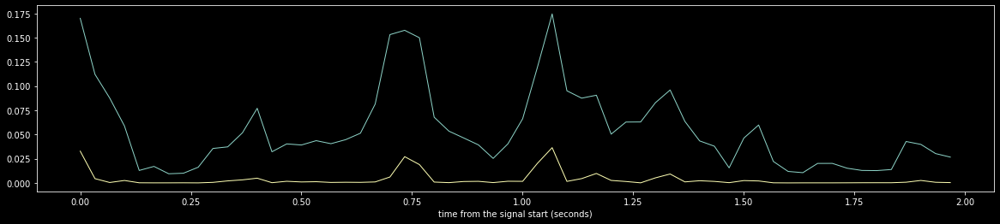

In [756]:
startTime = 0
endTime = startTime + 2

temporalPlot(ampHilTransformedFrameAvgBroadBand/max(ampHilTransformedFrameAvgBroadBand),startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=0)

temporalPlot(powerInEachFramBroadBand/max(powerInEachFramBroadBand),startTime,\
             endTime,cameraAvgFrameRate,figuresize=(20,4),figNo=0)

(array([1.97700e+04, 1.13112e+05, 2.07860e+04, 9.89000e+02, 1.31000e+02,
        2.50000e+01, 9.00000e+00, 8.00000e+00, 1.00000e+00, 1.00000e+00]),
 array([0.02398968, 0.576881  , 1.12977233, 1.68266365, 2.23555498,
        2.78844631, 3.34133763, 3.89422896, 4.44712028, 5.00001161,
        5.55290293]),
 <a list of 10 Patch objects>)

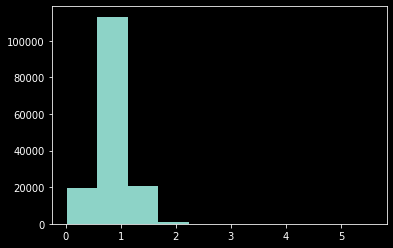

In [724]:
plt.hist(ampHilTransformedFrameAvg_10Hz/ampHilTransformedFrameAvgBroadBand)

(array([1.02146e+05, 4.37480e+04, 8.04300e+03, 6.88000e+02, 1.47000e+02,
        3.90000e+01, 1.40000e+01, 4.00000e+00, 2.00000e+00, 1.00000e+00]),
 array([0.00757409, 0.33979001, 0.67200594, 1.00422187, 1.33643779,
        1.66865372, 2.00086965, 2.33308557, 2.6653015 , 2.99751742,
        3.32973335]),
 <a list of 10 Patch objects>)

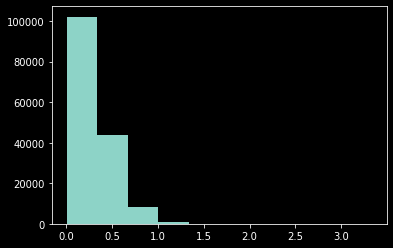

In [725]:
plt.hist(ampHilTransformedFrameAvgGamma/ampHilTransformedFrameAvgBroadBand)

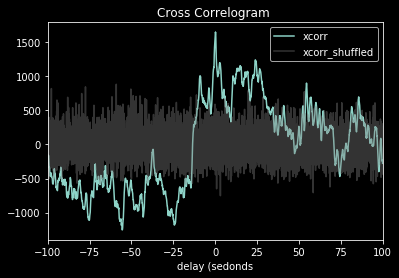

In [713]:
# zscore of smoothed motion signal and hilbert amp of LFP used to calculate the cross correlogram
# during the spont activity (up to "lastFrameDuringSpontActivity")
signal1 = stats.zscore(movingWindowEnergy[:lastFrameDuringSpontActivity])

signal2 = stats.zscore(ampHilTransformedFrameAvgGamma[:lastFrameDuringSpontActivity]/\
                       ampHilTransformedFrameAvg_10Hz[:lastFrameDuringSpontActivity])

crossCorrelogram(signal1,signal2,cameraAvgFrameRate,100,figTitle='')

### checking the LFP after movement start

In [ ]:
extraTimeToShow = 2

for alertMovementEpochCounter in range(len(alertChoosedEpochsStarts)):
    
    epochStartTime = alertChoosedEpochsStarts[alertMovementEpochCounter]/cameraAvgFrameRate
    epochEndTime = alertChoosedEpochsEnds[alertMovementEpochCounter]/cameraAvgFrameRate
    
    epochStartTime = epochStartTime - extraTimeToShow
    epochEndTime = epochEndTime + extraTimeToShow
    
    plt.figure()
    temporalPlot(movingWindowEnergy,epochStartTime,epochEndTime,cameraAvgFrameRate)
    temporalPlot(alertnessThreshold*np.ones(len(movingWindowEnergy)),\
             epochStartTime,epochEndTime,cameraAvgFrameRate)

In [310]:
alertChoosedEpochsStarts, alertChoosedEpochsEnds, nonAlertChoosedEpochsStarts, \
    nonAlertChoosedEpochsEnds = exctractAlertAndNonAlertPeriods(pupilSmoothArea,framesStartSample,\
                0,spontEndTime, minimumConsistentStateDur = 2,\
                alertnessThreshold = alertnessThreshold)

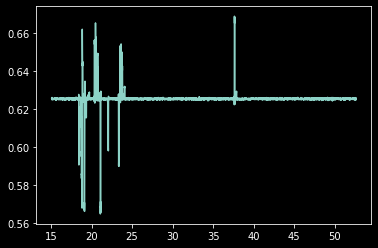

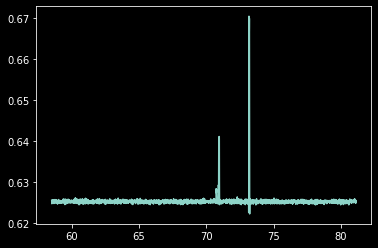

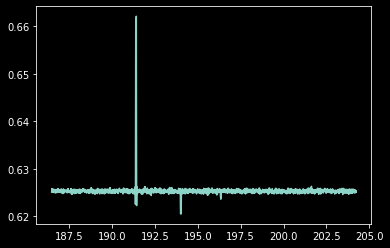

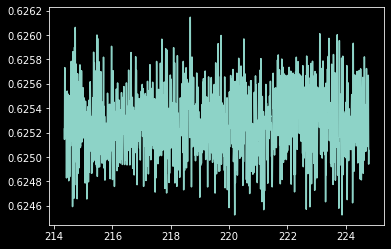

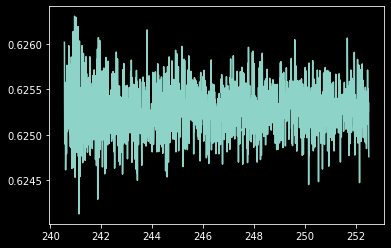

...

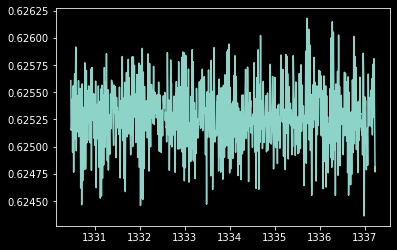

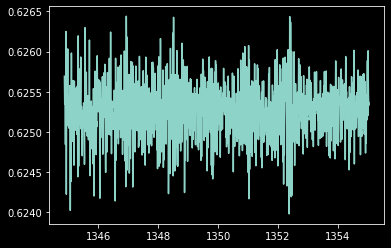

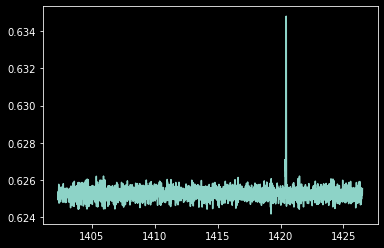

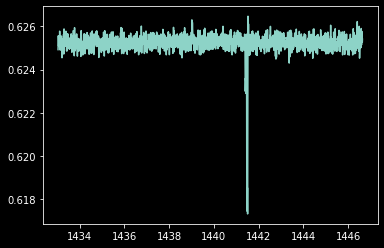

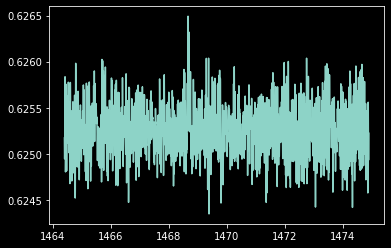

In [96]:
timeToExclude = 0
for epochCounter in range(len(alertChoosedEpochsStarts)):
        
        epochStartSample = int(framesStartSample[alertChoosedEpochsStarts[epochCounter]])\
                                    + int(timeToExclude*fs)
        epochEndSample = int(framesStartSample[alertChoosedEpochsEnds[epochCounter]])\
                                    - int(timeToExclude*fs)
        
        epochStartTime = epochStartSample/fs
        epochEndTime = epochEndSample/fs
        
        plt.figure()
        temporalPlot(wheelSensorSignal,epochStartTime,epochEndTime,fs)

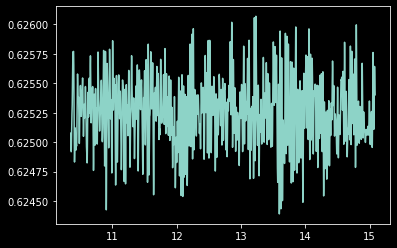

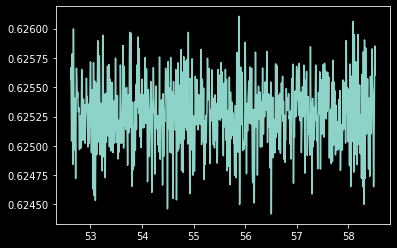

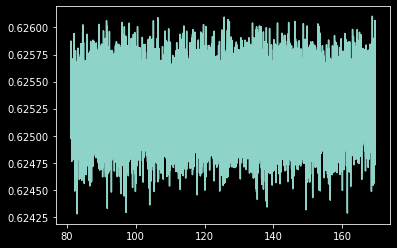

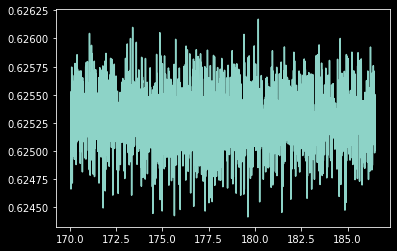

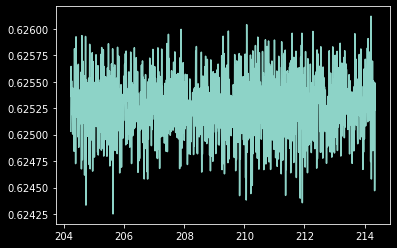

...

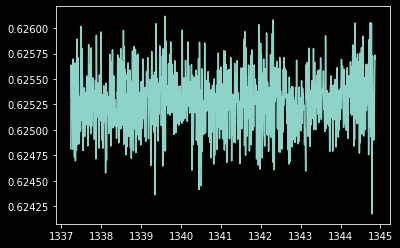

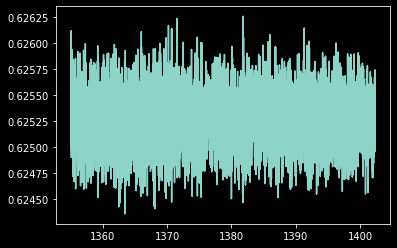

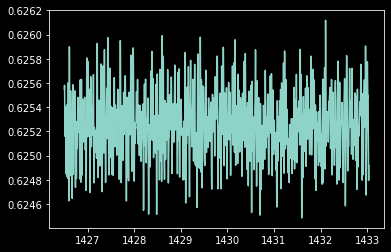

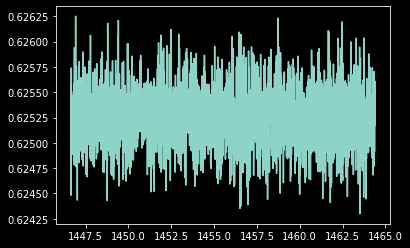

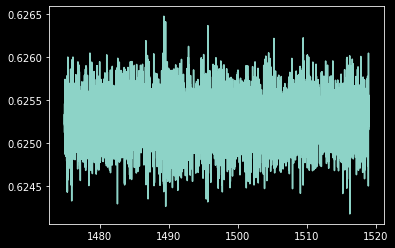

In [97]:
timeToExclude = 0
for epochCounter in range(len(nonAlertChoosedEpochsStarts)):
        
        epochStartSample = int(framesStartSample[nonAlertChoosedEpochsStarts[epochCounter]])\
                                    + int(timeToExclude*fs)
        epochEndSample = int(framesStartSample[nonAlertChoosedEpochsEnds[epochCounter]])\
                                    - int(timeToExclude*fs)
        
        epochStartTime = epochStartSample/fs
        epochEndTime = epochEndSample/fs
        
        plt.figure()
        temporalPlot(wheelSensorSignal,epochStartTime,epochEndTime,fs)

(0.01, 0.7153591543922097)

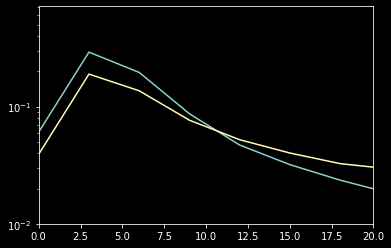

In [450]:
plt.semilogy(f, np.mean(alertSpectrumL5,0))
plt.semilogy(f, np.mean(nonAlertSpectrumL5,0))
plt.xlim(0,20)
plt.ylim([1e-2,0])

In [520]:
timToExclude = 3

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]
f, alertSpectrumL5, nonAlertSpectrumL5 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 3, figTitle = 'Spectrum L5')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L4channelNo]
f, alertSpectrumL4, nonAlertSpectrumL4 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 2, figTitle = 'Spectrum L4')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L23channelNo]
f, alertSpectrumL23, nonAlertSpectrumL23 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 2, figTitle = 'Spectrum L2/3')

17

 
alert Total Power: 12914.35283489961
non-alert Total Power: 32391.841995910076
 
alert Total Power: 33173.45045769158
non-alert Total Power: 88102.41802823322
 
alert Total Power: 61003.632166523144
non-alert Total Power: 176004.22931046592


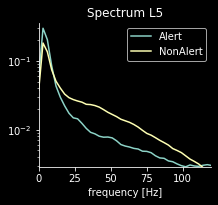

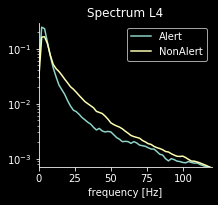

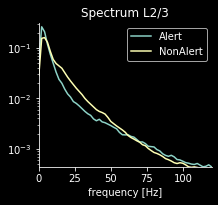

In [119]:
timToExclude = 3

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L5channelNo]
f, alertSpectrumL5, nonAlertSpectrumL5 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 3, figTitle = 'Spectrum L5')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L4channelNo]
f, alertSpectrumL4, nonAlertSpectrumL4 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 2, figTitle = 'Spectrum L4')

inputSignalToFreqAnalysis = dataMatrixReorderLowPassFiltered[L23channelNo]
f, alertSpectrumL23, nonAlertSpectrumL23 = spectrumCompareAlertNonAlert(inputSignalToFreqAnalysis,\
        alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = timToExclude, df = 2, figTitle = 'Spectrum L2/3')

### spont FR between alert and non alert periods

Text(0.5, 1.0, 'FR change with alertness')

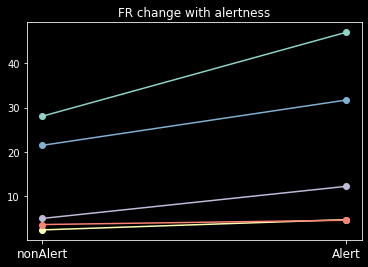

In [120]:
alertSpontFR, nonAlertSpontFR, alertSpontDur, nonAlertSpontDur = \
spontFR_CompareAlertAndNonAlert(spikeTime, spikeClusters, spikeClustersToPlot,\
     alertChoosedEpochsStarts, alertChoosedEpochsEnds,\
     nonAlertChoosedEpochsStarts, nonAlertChoosedEpochsEnds, framesStartSample,\
     timeToExclude = 0)

plt.figure()
plt.plot([1,2],np.array([nonAlertSpontFR,alertSpontFR]),'o-')
plt.xticks([1,2],(['nonAlert','Alert']),fontsize=12)
plt.title('FR change with alertness')

Text(0.25, 1.75, 'p=0.01')

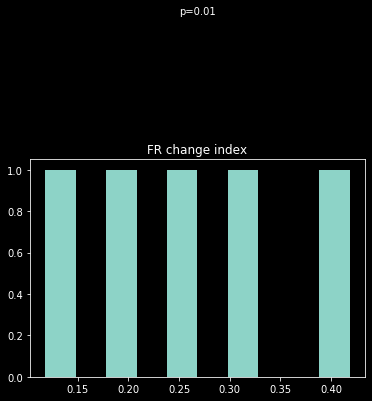

In [121]:
stateFR_changeIndex = (alertSpontFR - nonAlertSpontFR)/(nonAlertSpontFR + alertSpontFR)
pvalFRStateChange = stats.ttest_1samp(stateFR_changeIndex,0)[1]
plt.hist(stateFR_changeIndex)
plt.title('FR change index')
plt.text(0.25,1.75,'p=%(number)0.2f'%{'number':pvalFRStateChange})

In [479]:
f, welchEstimatedPowerSpectrum, estimatedTotalPower = \
                    powerSpectrumSingleChannel(\
                        testSig1,\
                            fs, figToShow = False,\
                                        maxFreqToShow = 120, freqRes = 0.5, Normalized = 1 )

print(estimatedTotalPower)

0.24999999474014514


### variables to save

In [158]:
# 0 waveshapes
# 1 spikeWidth
# 2 spont FRs
# 3 clusterChannel
# 4 spike-triggered pupil area
# 5 responsiveness 
# 6 baselineCorrectedResponse
# 7 OSI
# 8 Alert OSI
# 9 nonAlert OSI
# 10 relative response Change By Arousal
# 11 basline change by arousal
# 12 evoked-response change by arousal
# 13 best direction response change by arousal
# 14 noise correlation alert
# 15 noise correlation non-alert
# 16 normalized high freq power on all channels
# 17 high freq power on all channels
# 18 power sepctrum L5
# 19 power spectrum L4
# 20 power spectrum L23
# 21 frequency vector
# 22 power spectrum alert L5
# 23 power spectrum non alert L5
# 24 power spectrum alert L4
# 25 power spectrum non alert L4
# 26 power spectrum alert L23
# 27 power spectrum non alert L23
# 28 alert spont FR
# 29 non-alert spont FR

animalName = dataFileBaseFolder[len(dataFileBaseFolder) - dataFileBaseFolder[::-1].find('/'):\
                   len(dataFileBaseFolder) - 13]

savingAdd = 'Y://Ehsan-temp//Claire-Ehsan_Share//DataToMerge//'

variableToExportToMerge = [spikeShapesFiltered, spikeWidthAll, spontFRs, clusterChannel,\
        allSpikeTriggeredPupil, allClustersResponsiveness, \
        allClustersBaselineCorrectedResponse, allOSI, OSI_Alert, OSI_nonAlert,\
        allClustersNormalizedArousalResponseChange, allClustersNormalizedArousalBaselineChange,\
        evokedResponseChangeByArousa, bestDirectionRelResponseChangeByArousal, noiseCorrAlert, \
        noiseCorrNonAlert, allChannelsNormHighFreqPower, allChannelsHighFreqPower, powerSpectrumL5,\
        powerSpectrumL4, powerSpectrumL23, f_powerSpectrum, alertSpectrumL5, nonAlertSpectrumL5,\
        alertSpectrumL4, nonAlertSpectrumL4, alertSpectrumL23, nonAlertSpectrumL23,\
        alertSpontFR, nonAlertSpontFR]

import pickle
pickle.dump(variableToExportToMerge, open(savingAdd+animalName+'.pkl', "wb" ) )

[32.71804634799166,
 3.2392595875820027,
 7.179795345342389,
 3.7695251226885307,
 24.668615525074564]